In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
import scipy.io


In [2]:
# sets the figure size and font
plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams.update({'font.size': 18})

In [3]:
# loads the faces 
mat_contents = scipy.io.loadmat('allFaces.mat') # based on the Yale Faces Database
faces = mat_contents['faces']
print('faces is an array of size ', faces.shape)
# first size is the resolution (height by width) and the number of faces 

m = int(mat_contents['m']) # number of 
n = int(mat_contents['n']) # number of 

# nfaces contains the number of picture for each person face in the matrix
# they add up to the width of the matrix. to verify try print(sum(nfaces)) 
nfaces = np.ndarray.flatten(mat_contents['nfaces'])
print('nfaces is an array of size ', nfaces.shape)

allPersons = np.zeros((n*6,m*6))
count = 0


faces is an array of size  (32256, 2410)
nfaces is an array of size  (38,)


(1152, 1008)


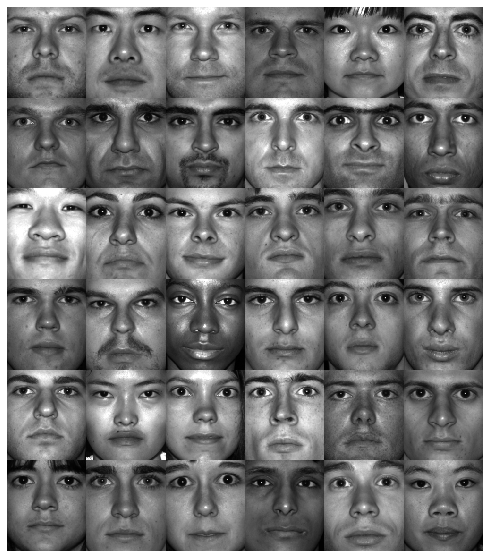

In [4]:
for j in range(6):
    for k in range(6):
        allPersons[j*n : (j+1)*n, k*m : (k+1)*m] = np.reshape(faces[:,np.sum(nfaces[:count])],(m,n)).T
        count += 1

# these will be the first 36 people in the database arrange in one image
# for one specific light condition

print(allPersons.shape)
img = plt.imshow(allPersons)
img.set_cmap('gray')
plt.axis('off')
plt.show()

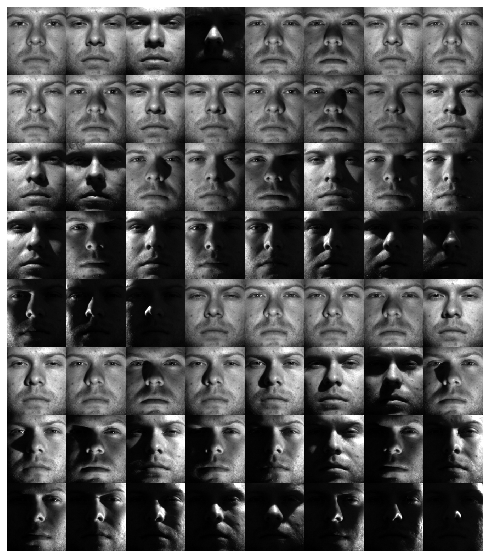

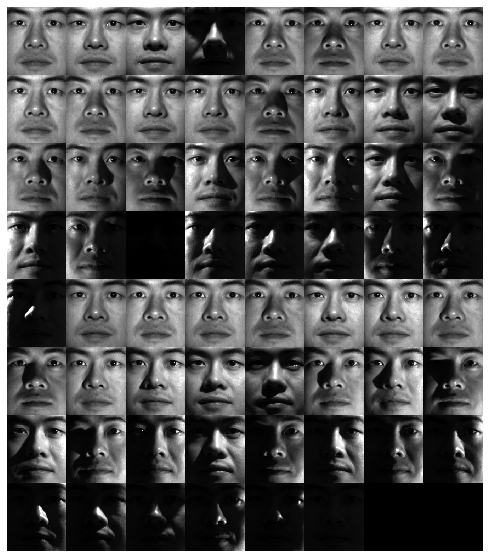

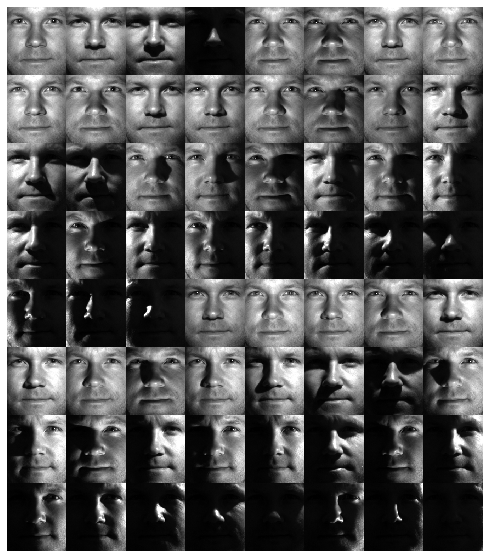

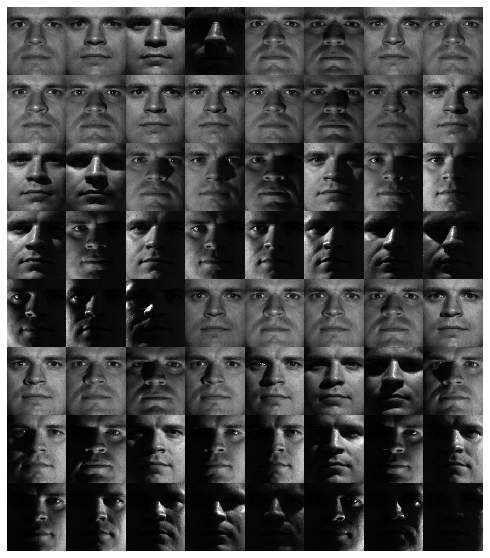

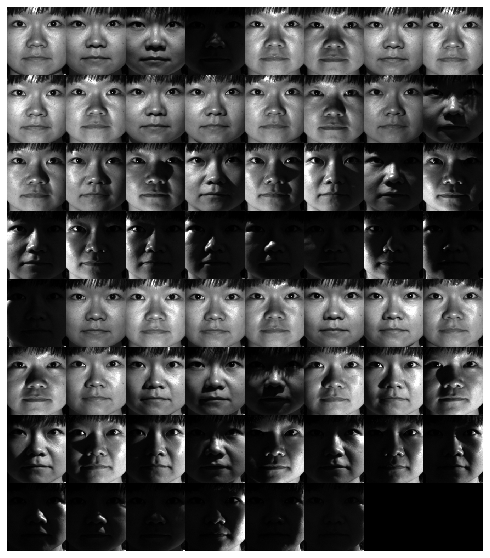

...

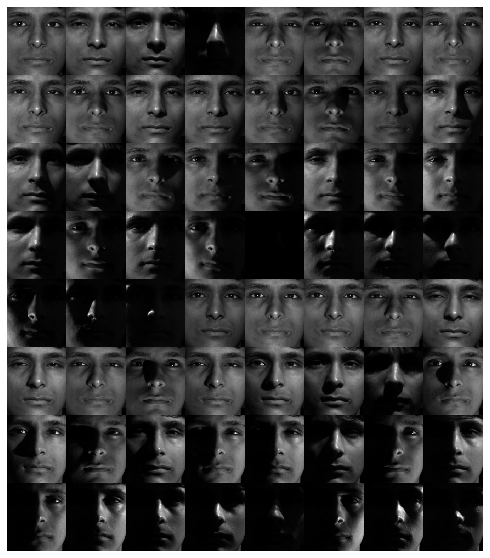

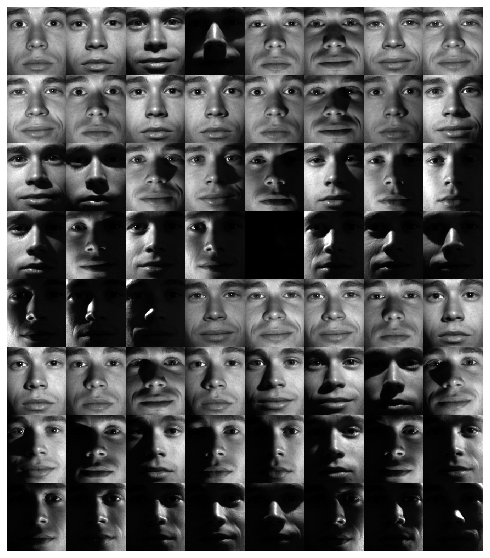

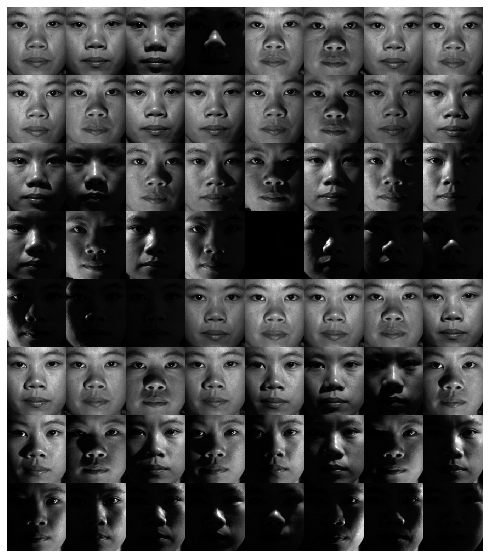

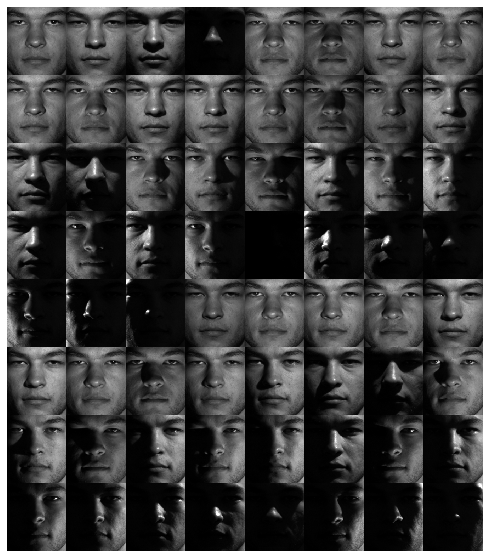

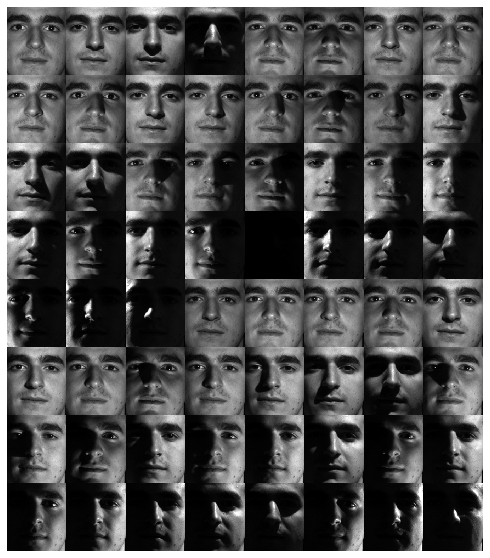

In [5]:
# now show a composite of a few faces with different light conditions
personFace = {}
for person in range(len(nfaces)): # for all the number of persons. remember nfaces contains the
    subset = faces[ :, sum(nfaces[:person]):sum(nfaces[:(person+1)]) ] # the number of pic for each person
    # remember: the first dimension of the faces is the value of the pixels (m x n)
    personFace[person] = subset 
    subsetFaces = np.zeros((n*8, m*8))
    count = 0
    #subset has the indices for 64 faces
    for j in range(8):
        for k in range(8):
            if count < nfaces[person]: # until you get to the number of shades for each person
                subsetFaces[j*n : (j+1)*n, k*m : (k+1)*m] = np.reshape(subset[:,count],(m,n)).T
                
                count += 1
    img = plt.imshow(subsetFaces)
    img.set_cmap('gray')
    plt.axis('off')
    plt.show()


In [6]:
# Now personFace is a dictionary that has each face
print(personFace.keys())

dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37])


In [7]:
# We use the first 20 people for training data
trainingFaces = faces[:,:np.sum(nfaces[:20])]
avgFace = np.mean(trainingFaces,axis=1) # Compute the average face for the training set

# Compute eigenfaces on mean-subtracted training data
X = trainingFaces - np.tile(avgFace,(trainingFaces.shape[1],1)).T # centering the training faces matrix
U, S, VT = np.linalg.svd(X,full_matrices=0) # take the SVD of the data matrix with 20 people



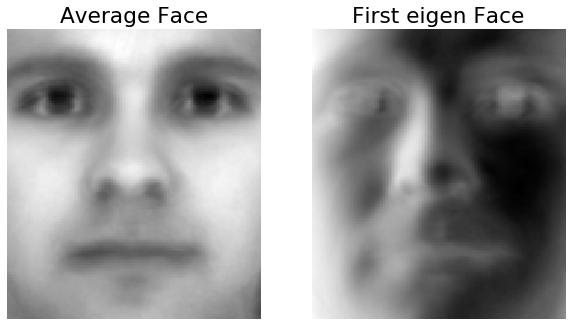

In [8]:
fig1 = plt.figure()
ax1 = fig1.add_subplot(121)
img_avg = ax1.imshow(np.reshape(avgFace,(m,n)).T)
img_avg.set_cmap('gray')
plt.axis('off')
plt.title('Average Face')

ax2 = fig1.add_subplot(122)
img_u1 = ax2.imshow(np.reshape(U[:,0],(m,n)).T)
img_u1.set_cmap('gray')
plt.axis('off')
plt.title('First eigen Face')

plt.show()

# in other words each of the faces in the training set will be represented
# as a linear combination of the eigen faces as expressed by the SVD (U*S*VT)
# S is already expressed a 1D array (diagonal of the singular value matrix)
# (also there are no zero values in S, as it's an economy SVD)



Text(0.5, 0, 'Eigenface number')

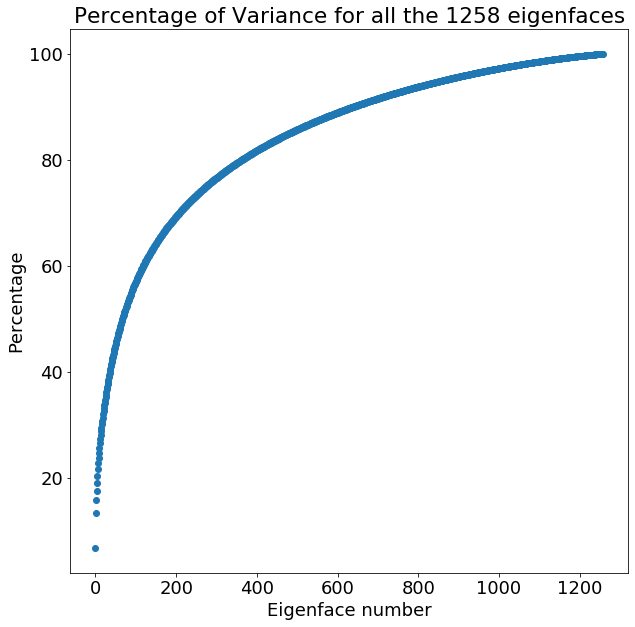

In [9]:
plt.plot(np.arange(0,len(S)),np.cumsum(S/sum(S))*100,'o')
plt.title('Percentage of Variance for all the ' + str(len(S)) + ' eigenfaces')
plt.ylabel('Percentage')
plt.xlabel('Eigenface number')

In [10]:
# Now we do the same for just the first person with all its 64 shades
trainingFace = personFace[1]
avgFace = np.mean(trainingFaces,axis=1) # Compute the average face for the training set

# Compute eigenfaces on mean-subtracted training data
Xf = trainingFace - np.tile(avgFace.T,(trainingFace.shape[1],1)).T # centering the training faces matrix
Uf, Sf, VTf = np.linalg.svd(Xf,full_matrices=0) # take the SVD of the data matrix with 20 people

Text(0.5, 0, 'Eigenface number')

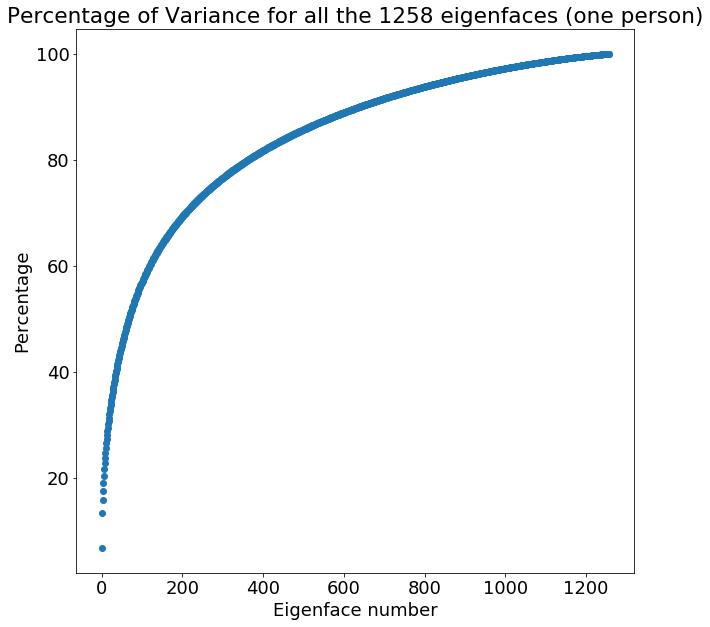

In [11]:
plt.plot(np.arange(0,len(S)),np.cumsum(S/sum(S))*100,'o')
plt.title('Percentage of Variance for all the ' + str(len(S)) + ' eigenfaces (one person)')
plt.ylabel('Percentage')
plt.xlabel('Eigenface number')
# again, this curve is quite smooth, making it difficult to decide an optimal truncation just by eyeballing the 
# singular value changes

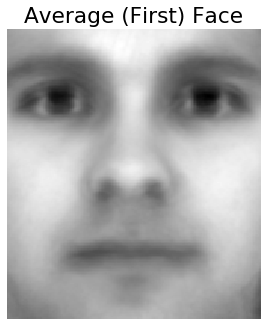

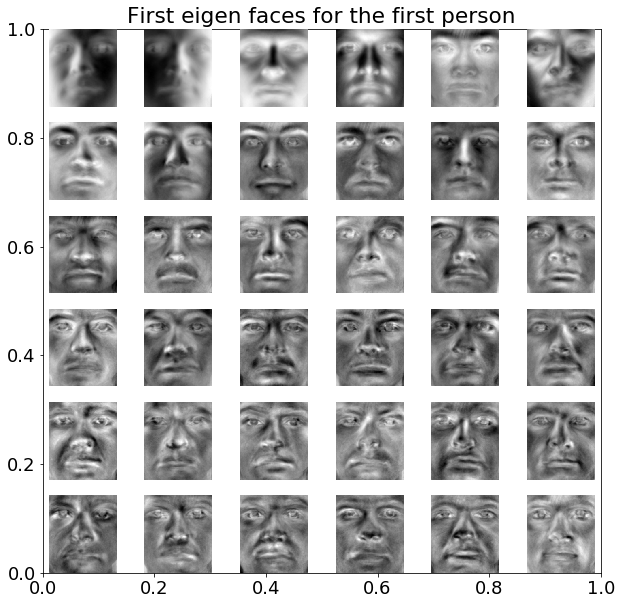

In [12]:
fig1 = plt.figure()
ax1 = fig1.add_subplot(121)
img_avg = ax1.imshow(np.reshape(avgFace,(m,n)).T)
img_avg.set_cmap('gray')
plt.axis('off')
plt.title('Average (First) Face')

fig2 = plt.figure()
        
plt.title('First eigen faces for the first person')
for fc in range(6*6): #range(U.shape[1]):
        ax2 = fig2.add_subplot(6,6,fc+1)
        img_u1 = ax2.imshow(np.reshape(U[:,fc],(m,n)).T)
        img_u1.set_cmap('gray')
        plt.axis('off')


plt.show()

Text(0.5, 1.0, 'Weighted sum')

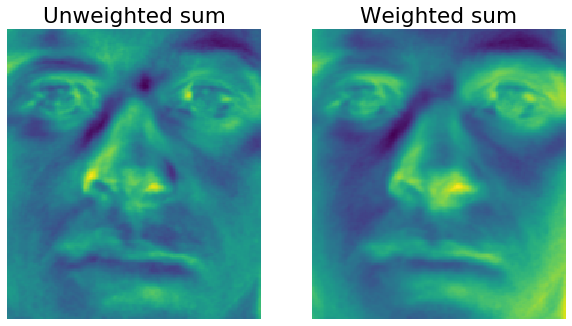

In [13]:
# Let's form an average face by adding up the first 10 eigenfaces

# And the by adding up the first 10 eigenfaces as a linear combination with 
# coefficients established by the first 10 singular values

fig1 = plt.figure()
ax1 = fig1.add_subplot(121)
Usum = np.zeros((n,m))
for u in range(50):
    Usum += np.reshape(U[:,u],(m,n)).T

img_avg = ax1.imshow(Usum)
#img_avg.set_cmap('gray')
plt.axis('off')
plt.title('Unweighted sum')

Usum = np.zeros((n,m))
ax2 = fig1.add_subplot(122)
for u in range(50):
    Usum += (S[u]/np.sum(S))*np.reshape(U[:,u],(m,n)).T
img_avg = ax2.imshow(Usum)
#img_avg.set_cmap('gray')
plt.axis('off')
plt.title('Weighted sum')

# The weighted sum has much better contours

(32256, 62) times (62, 62) times (62, 62) = (32256, 62)
(32256, 62)


(-0.5, 167.5, 191.5, -0.5)

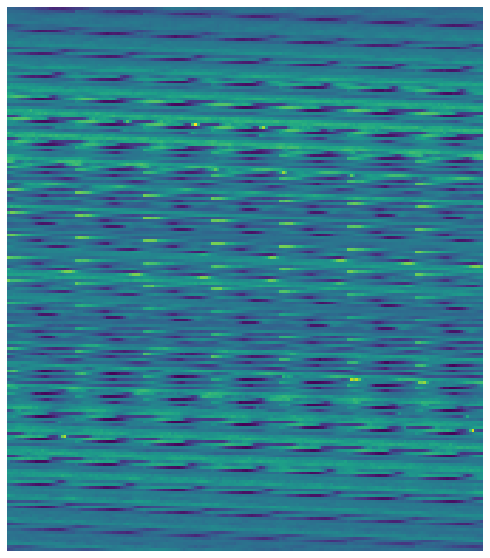

In [14]:
# We should truncate the SVD with using the first r 
# eigenvalues (bear in mind that eigenvalues are ordered in ascending order)

# this represent the dimensional matrix multiplication.
print(str(Uf.shape) + ' times ' + str(np.diag(Sf).shape) + ' times '+ str(VTf.shape) + ' = ' + str((Uf.shape[0],VTf.shape[1])))

# We can reduce the middle value by taking only the first r eigenvalues
r = 62
Urf = np.dot(np.dot(Uf[:,:r],np.diag(Sf)[:r,:r]),VTf[:r,:])
print(Urf.shape)

fig1 = plt.figure()
img_Urf = plt.imshow(Urf[:,1].reshape((n,m)))
img_avg.set_cmap('gray')
plt.axis('off')
#plt.title('Unweighted sum')



We now want to see a few different $PCA_{modes}$ (we'll have 3 so we can visualise them in 3D plot).
And we see how the faces of three perople (indexed by $P_{num}$) look on those different PCA modes.
You should see that apart from scattered value in the periphery, the bulk of those 64 eigenfaces 
can be told apart by finding a reasonably good plane (or hyperplane) that separate the different faces by looking at those Principal Components

In [90]:
## Project persons indexed i onto the PCA modes 
from mpl_toolkits import mplot3d
Pnum = np.array([2,7,8])
#PCAmodes = [1, 2, 3] # Project onto PCA modes
#PCAmodes = [5, 6, 7] # Project onto PCA modes
PCAmodes = [5, 6, 7] # Project onto PCA modes
shapes = ['d','^','s','o','d']
colors = ['r','b','k','g']

# Recalculate average face using the first 36 people
trainingFaces = faces[:,:np.sum(nfaces[:36])]
avgFace = np.mean(trainingFaces,axis=1) # Compute the average face for the training set

plt.rcParams['figure.figsize'] = [15, 15]
plt.rcParams.update({'font.size': 12})
fig = plt.figure()
ax3d = fig.add_subplot(311,projection='3d')
ax2d = fig.add_subplot(312)
ax2d2 = fig.add_subplot(313)

P = {}; PCACoords = {}; labels = {}
for c, i in enumerate(Pnum):
    P[c] = personFace[i-1] # Person number i (dict)
    P[c] = P[c] - np.tile(avgFace,(P[c].shape[1],1)).T  # Subtract average
    PCACoords[c] = U[:,PCAmodes - np.ones_like(PCAmodes)].T @ P[c]
    # ones_like return a array filled with 1 with the same size as the input
    labels[c] = 'Person ' + str(i)
    #ax3d.plot(PCACoords[c][1,:],PCACoords[c][0,:],shapes[c],colors[c],label=labels[c])
    ax3d.scatter(PCACoords[c][2,:],PCACoords[c][1,:],PCACoords[c][0,:],c=colors[c],marker=shapes[c]
    ax2d.scatter(PCACoords[c][1,:],PCACoords[c][0,:],c=colors[c],marker=shapes[c])
    ax2d2.scatter(PCACoords[c][2,:],PCACoords[c][0,:],c=colors[c],marker=shapes[c])
                 
plt.axis('on')
#plt.legend()
ax3d.set_xlabel('PCA mode {}'.format(PCAmodes[2]));
ax3d.set_ylabel('PCA mode {}'.format(PCAmodes[1]));
ax3d.set_zlabel('PCA mode {}'.format(PCAmodes[0]));

ax2d.set_xlabel('PCA mode {}'.format(PCAmodes[2]));
ax2d.set_ylabel('PCA mode {}'.format(PCAmodes[1]));

plt.show()
plt.tight_layout()

SyntaxError: invalid syntax (<ipython-input-90-6b294dd19a31>, line 30)